# Project 5: Disneyland Park and Rating Classifier
## Part II: Exploratory Data Analysis

### 1. Imports

In [2]:
import os
import sys

# essentials:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 


# plotly:
import plotly
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# scikit-learn:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression, ElasticNet
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, f1_score, balanced_accuracy_score, accuracy_score, RocCurveDisplay, roc_auc_score, recall_score, precision_score, confusion_matrix
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier, KNeighborsRegressor
from sklearn.pipeline import make_pipeline
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.metrics import precision_score, recall_score, accuracy_score, ConfusionMatrixDisplay, roc_auc_score
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, plot_tree
from sklearn.ensemble import VotingRegressor, BaggingClassifier, BaggingRegressor, RandomForestClassifier, RandomForestRegressor, ExtraTreesClassifier
from sklearn.ensemble import AdaBoostRegressor, AdaBoostClassifier, GradientBoostingRegressor, GradientBoostingClassifier, HistGradientBoostingClassifier, HistGradientBoostingRegressor 
from sklearn.dummy import DummyClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.inspection import plot_partial_dependence
from sklearn.feature_extraction import text 
from sklearn.svm import SVC

# NN & NLP scikit-learn:
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import Perceptron
from sklearn.datasets import make_blobs
from sklearn.datasets import fetch_openml, make_classification, make_regression
from sklearn import set_config
from sklearn.base import BaseEstimator, TransformerMixin

# unsupervised learning scikit-learn:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import pairwise_distances, cosine_distances, cosine_similarity

# imblearn:
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN, SMOTENC

# API & Webscraping:
import time
import requests
import datetime
from bs4 import BeautifulSoup

# nltk:
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize, RegexpTokenizer
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.corpus import stopwords
from nltk.chunk.regexp import RegexpParser
from nltk.chunk import tree2conlltags
from nltk import word_tokenize
from nltk.corpus import PlaintextCorpusReader

# tensorflow/keras:
import tensorflow as tf
import tensorboard
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical
from keras.preprocessing.text import Tokenizer
from keras.layers import SimpleRNN, LSTM, GRU, Dense
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Embedding
from keras.layers import Bidirectional
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.layers import Conv1D, MaxPooling1D, GlobalMaxPooling1D
from tensorflow.keras.callbacks import EarlyStopping

# time series/sktime:
import sktime
import statsmodels
import pmdarima as pmd
import pandas_datareader as pdr
from keras.preprocessing.sequence import TimeseriesGenerator
from sktime.forecasting.compose import EnsembleForecaster
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.forecasting.naive import NaiveForecaster
from sktime.forecasting.arima import AutoARIMA
from sktime.forecasting.ets import AutoETS
from sktime.utils.plotting import plot_series


# spacy: 
import spacy
from spacy.matcher import Matcher
from spacy import displacy

# statsmodels:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf

# emojis:
import emoji
import demoji

# others:
import scipy.stats as stats
import missingno as msno
from itertools import groupby
from IPython.display import display

### 2. Read in & Inspect Data

In [3]:
disney = pd.read_csv('../data/Clean_DisneylandReviews.csv')

In [4]:
disney.head()

,Branch,park,Review_Text,clean_text,Reviewer_Location,Year_Month,year,month,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
0,Disneyland_HongKong,3,If you've ever been to Disneyland anywhere you...,if you've ever been to disneyland anywhere you...,Australia,2019-4,2019,4,59,0.561481,0.239352,0.6786,4
1,Disneyland_HongKong,3,Its been a while since d last time we visit HK...,its been a while since d last time we visit hk...,Philippines,2019-5,2019,5,171,0.459783,0.205797,0.9879,4
2,Disneyland_HongKong,3,Thanks God it wasn t too hot or too humid wh...,thanks god it wasn t too hot or too humid when...,United Arab Emirates,2019-4,2019,4,169,0.434857,0.119238,0.9945,4
3,Disneyland_HongKong,3,HK Disneyland is a great compact park. Unfortu...,hk disneyland is a great compact park unfortun...,Australia,2019-4,2019,4,91,0.512143,0.189286,0.8489,4
4,Disneyland_HongKong,3,"the location is not in the city, took around 1...",the location is not in the city took around 1 ...,United Kingdom,2019-4,2019,4,31,0.437500,0.266667,0.2846,4


In [5]:
disney.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42656 entries, 0 to 42655
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Branch             42656 non-null  object 
 1   park               42656 non-null  int64  
 2   Review_Text        42656 non-null  object 
 3   clean_text         42656 non-null  object 
 4   Reviewer_Location  42656 non-null  object 
 5   Year_Month         42656 non-null  object 
 6   year               42656 non-null  object 
 7   month              42656 non-null  object 
 8   text_word_count    42656 non-null  int64  
 9   subjectivity       42656 non-null  float64
 10  tb_polarity        42656 non-null  float64
 11  vs_polarity        42656 non-null  float64
 12  Rating             42656 non-null  int64  
dtypes: float64(3), int64(3), object(7)
memory usage: 4.2+ MB


In [6]:
disney.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,42656.000000,42656.000000,42656.000000,42656.000000,42656.000000,42656.000000
mean,1.770583,129.703817,0.524574,0.212199,0.680870,4.217695
std,0.792370,154.713032,0.124134,0.175264,0.477683,1.063371
min,1.000000,3.000000,0.000000,-1.000000,-0.997700,1.000000
25%,1.000000,45.000000,0.450786,0.105354,0.640925,4.000000
50%,2.000000,81.000000,0.519638,0.203333,0.895700,5.000000
75%,2.000000,156.000000,0.594202,0.311590,0.966100,5.000000
max,3.000000,3963.000000,1.000000,1.000000,0.999900,5.000000


In [7]:
disney['Rating'].nunique()

5

In [8]:
disney['Rating'].value_counts()

5    23146
4    10775
3     5109
2     2127
1     1499
Name: Rating, dtype: int64

In [9]:
disney['Branch'].value_counts()

Disneyland_California    19406
Disneyland_Paris         13630
Disneyland_HongKong       9620
Name: Branch, dtype: int64

In [10]:
disney['Reviewer_Location'].value_counts()

United States     14551
United Kingdom     9751
Australia          4679
Canada             2235
India              1511
                  ...  
Namibia               1
Armenia               1
Timor-Leste           1
South Sudan           1
Åland Islands         1
Name: Reviewer_Location, Length: 162, dtype: int64

### 3. Heatmaps

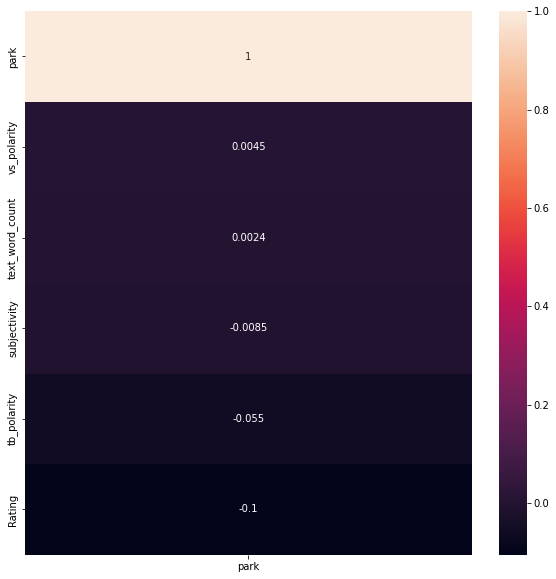

In [11]:
# heatmap of correlations of features to parks in order
plt.figure(figsize=(10,10))
sns.heatmap(disney.corr()[['park']].sort_values(by='park', ascending=False), annot=True);

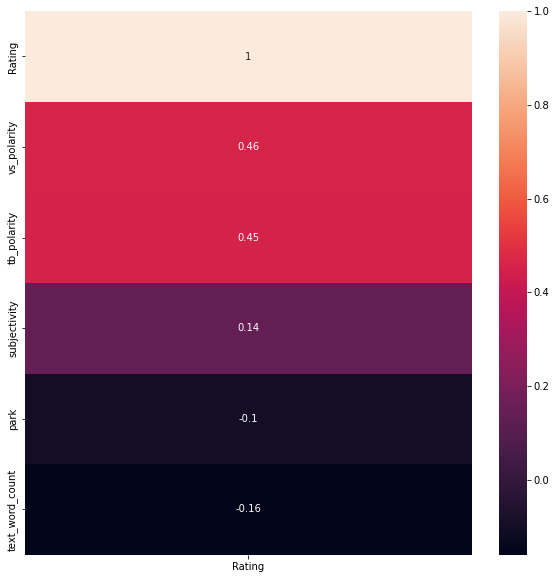

In [12]:
# heatmap of correlations of features to ratings in order
plt.figure(figsize=(10,10))
sns.heatmap(disney.corr()[['Rating']].sort_values(by='Rating', ascending=False), annot=True);

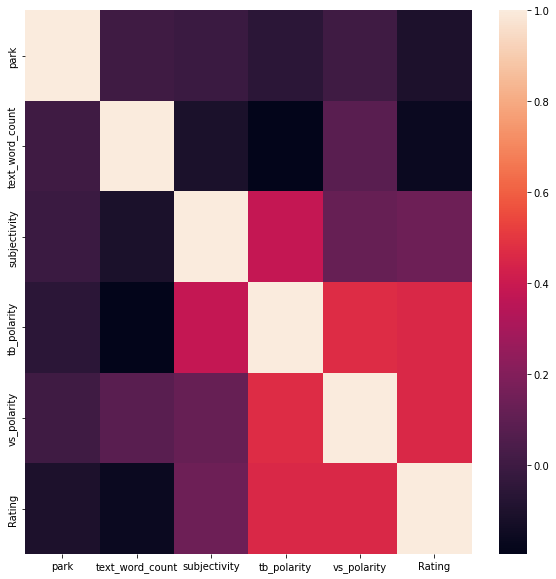

In [16]:
plt.figure(figsize=(10,10))
sns.heatmap(disney.corr());

### 4. Creating Dataframes

In [17]:
disney_paris = disney[(disney['Branch'] == 'Disneyland_Paris')]

In [18]:
disney_cali = disney[(disney['Branch'] == 'Disneyland_California')]

In [19]:
disney_hongkong = disney[(disney['Branch'] == 'Disneyland_HongKong')]

In [20]:
disney_paris.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,13630.0,13630.000000,13630.000000,13630.000000,13630.000000,13630.000000
mean,2.0,169.369773,0.525395,0.182306,0.642043,3.960088
std,0.0,189.205720,0.115114,0.168525,0.542395,1.205324
min,2.0,3.000000,0.000000,-0.862500,-0.997300,1.000000
25%,2.0,58.000000,0.456414,0.080060,0.599400,3.000000
50%,2.0,112.000000,0.517700,0.173393,0.905700,4.000000
75%,2.0,209.000000,0.587955,0.275000,0.972275,5.000000
max,2.0,3963.000000,1.000000,1.000000,0.999900,5.000000


In [21]:
disney_cali.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,19406.0,19406.000000,19406.000000,19406.000000,19406.000000,19406.000000
mean,1.0,115.449036,0.525204,0.231148,0.692633,4.405339
std,0.0,143.022961,0.130947,0.179984,0.454424,0.975600
min,1.0,7.000000,0.000000,-1.000000,-0.996500,1.000000
25%,1.0,39.000000,0.450000,0.121695,0.658650,4.000000
50%,1.0,71.000000,0.521512,0.224440,0.891000,5.000000
75%,1.0,138.000000,0.599358,0.333333,0.962800,5.000000
max,1.0,3527.000000,1.000000,1.000000,0.999900,5.000000


In [22]:
disney_hongkong.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,9620.0,9620.000000,9620.000000,9620.000000,9620.000000,9620.000000
mean,3.0,102.259044,0.522138,0.216325,0.712153,4.204158
std,0.0,103.739529,0.122294,0.169162,0.418376,0.932989
min,3.0,6.000000,0.000000,-1.000000,-0.997700,1.000000
25%,3.0,44.000000,0.448778,0.116211,0.674375,4.000000
50%,3.0,70.000000,0.517657,0.210417,0.893750,4.000000
75%,3.0,123.000000,0.593715,0.312500,0.962700,5.000000
max,3.0,1591.000000,1.000000,1.000000,0.999800,5.000000


In [23]:
disney.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,42656.000000,42656.000000,42656.000000,42656.000000,42656.000000,42656.000000
mean,1.770583,129.703817,0.524574,0.212199,0.680870,4.217695
std,0.792370,154.713032,0.124134,0.175264,0.477683,1.063371
min,1.000000,3.000000,0.000000,-1.000000,-0.997700,1.000000
25%,1.000000,45.000000,0.450786,0.105354,0.640925,4.000000
50%,2.000000,81.000000,0.519638,0.203333,0.895700,5.000000
75%,2.000000,156.000000,0.594202,0.311590,0.966100,5.000000
max,3.000000,3963.000000,1.000000,1.000000,0.999900,5.000000


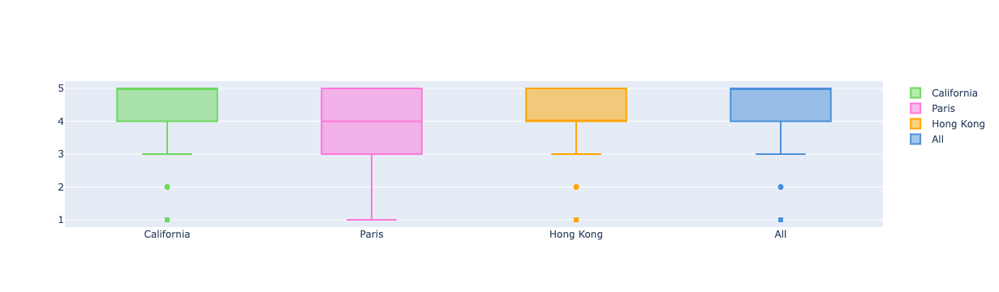

In [35]:
# boxplot of various ratings for parks
fig = go.Figure()

fig.add_trace(go.Box(y=disney_cali['Rating'], name='California',
                marker_color = '#6ED85F'))

fig.add_trace(go.Box(y=disney_paris['Rating'], name = 'Paris',
                marker_color = '#FF76DA'))

fig.add_trace(go.Box(y=disney_hongkong['Rating'], name = 'Hong Kong',
                marker_color = 'orange'))

fig.add_trace(go.Box(y=disney['Rating'], name = 'All',
                marker_color = '#4B90DA'))


fig.show()

# basic boxplot with no colors or labels
# fig = px.box(disney, x='park', y='Rating', color = 'park')
# fig.show()

In [36]:
disney_bad_reviews = disney[(disney['Rating'] <= 1)]
disney_good_reviews = disney[(disney['Rating'] >= 4)]

In [37]:
disney_bad_reviews.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,1499.000000,1499.000000,1499.000000,1499.000000,1499.000000,1499.0
mean,1.781855,197.166111,0.489945,-0.002762,-0.077002,1.0
std,0.632702,184.002586,0.113088,0.139996,0.720158,0.0
min,1.000000,14.000000,0.000000,-1.000000,-0.997700,1.0
25%,1.000000,81.000000,0.424063,-0.075000,-0.801450,1.0
50%,2.000000,147.000000,0.490606,0.007855,-0.190900,1.0
75%,2.000000,249.000000,0.557500,0.075291,0.672650,1.0
max,3.000000,1649.000000,1.000000,0.633333,0.999000,1.0


In [38]:
disney_good_reviews.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,33921.000000,33921.000000,33921.000000,33921.000000,33921.000000,33921.000000
mean,1.741989,119.417558,0.532326,0.248397,0.784498,4.682350
std,0.805126,148.723498,0.126718,0.163047,0.335373,0.465569
min,1.000000,3.000000,0.000000,-1.000000,-0.992100,4.000000
25%,1.000000,42.000000,0.458081,0.146944,0.768900,4.000000
50%,2.000000,74.000000,0.527083,0.235417,0.916900,5.000000
75%,2.000000,141.000000,0.601775,0.336574,0.970800,5.000000
max,3.000000,3963.000000,1.000000,1.000000,0.999900,5.000000


In [39]:
disney_small_wcs = disney[(disney['text_word_count'] <= 45)]
disney_big_wcs = disney[(disney['text_word_count'] >= 156)]

In [40]:
disney_small_wcs

,Branch,park,Review_Text,clean_text,Reviewer_Location,Year_Month,year,month,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
4,Disneyland_HongKong,3,"the location is not in the city, took around 1...",the location is not in the city took around 1 ...,United Kingdom,2019-4,2019,4,31,0.437500,0.266667,0.2846,4
6,Disneyland_HongKong,3,Great place! Your day will go by and you won't...,great place your day will go by and you won't ...,India,2019-4,2019,4,31,0.590000,0.110000,0.6997,5
10,Disneyland_HongKong,3,Disneyland never cease to amaze me! I've been ...,disneyland never cease to amaze me i've been t...,United States,2019-4,2019,4,42,0.466667,0.133333,0.4926,5
13,Disneyland_HongKong,3,It was indeed the happiest place on earth! My ...,it was indeed the happiest place on earth my f...,Philippines,2019-4,2019,4,22,0.600000,0.400000,0.8313,5
18,Disneyland_HongKong,3,It s Disneyland! It just does not need revie...,it s disneyland it just does not need reviewin...,Australia,2019-4,2019,4,20,0.550000,0.233333,0.6249,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
42449,Disneyland_Paris,2,First time at Disneyland. It was great!. Busy...,first time at disneyland it was great busy but...,United Kingdom,missing,miss,ng,31,0.455556,0.325000,0.8481,5
42476,Disneyland_Paris,2,"Bad food, very bad food, bad hotels but overal...",bad food very bad food bad hotels but overall ...,Germany,missing,miss,ng,20,0.466667,-0.335000,-0.5267,4
42502,Disneyland_Paris,2,Had an absolutely fantastic time. Loads to do...,had an absolutely fantastic time loads to do a...,United Kingdom,missing,miss,ng,37,0.535714,0.180357,0.9061,5
42574,Disneyland_Paris,2,Disneyland is one of those places everyone sho...,disneyland is one of those places everyone sho...,United Kingdom,missing,miss,ng,42,0.500000,0.200000,0.9381,5


In [41]:
disney_big_wcs

,Branch,park,Review_Text,clean_text,Reviewer_Location,Year_Month,year,month,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
1,Disneyland_HongKong,3,Its been a while since d last time we visit HK...,its been a while since d last time we visit hk...,Philippines,2019-5,2019,5,171,0.459783,0.205797,0.9879,4
2,Disneyland_HongKong,3,Thanks God it wasn t too hot or too humid wh...,thanks god it wasn t too hot or too humid when...,United Arab Emirates,2019-4,2019,4,169,0.434857,0.119238,0.9945,4
5,Disneyland_HongKong,3,"Have been to Disney World, Disneyland Anaheim ...",have been to disney world disneyland anaheim a...,Singapore,2019-4,2019,4,174,0.610397,-0.065476,0.9653,3
21,Disneyland_HongKong,3,First off I'm not a really big Disneyland fan....,first off i'm not a really big disneyland fan ...,United States,2019-4,2019,4,173,0.518275,0.201256,0.9543,3
29,Disneyland_HongKong,3,I need to say I have been to home of Disney...,i need to say i have been to home of disney di...,Australia,2019-4,2019,4,276,0.547201,-0.064167,-0.7722,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
42643,Disneyland_Paris,2,"The lines are low, thats good, the staff are r...",the lines are low thats good the staff are rud...,Australia,missing,miss,ng,163,0.677692,0.250000,0.9373,2
42645,Disneyland_Paris,2,I'm an avid Disney fan having been to Disney L...,i'm an avid disney fan having been to disney l...,United Kingdom,missing,miss,ng,515,0.494904,0.216028,0.9983,4
42651,Disneyland_Paris,2,i went to disneyland paris in july 03 and thou...,i went to disneyland paris in july 03 and thou...,United Kingdom,missing,miss,ng,173,0.570682,0.225000,0.9884,5
42652,Disneyland_Paris,2,2 adults and 1 child of 11 visited Disneyland ...,2 adults and 1 child of 11 visited disneyland ...,Canada,missing,miss,ng,191,0.637045,0.194773,0.9915,5


In [42]:
disney_small_wcs.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,11328.000000,11328.000000,11328.000000,11328.000000,11328.000000,11328.000000
mean,1.715219,31.493821,0.548776,0.283495,0.614616,4.508298
std,0.839525,8.725337,0.172679,0.227987,0.408795,0.848413
min,1.000000,3.000000,0.000000,-1.000000,-0.974900,1.000000
25%,1.000000,25.000000,0.450000,0.145833,0.492700,4.000000
50%,1.000000,32.000000,0.550000,0.288889,0.784500,5.000000
75%,3.000000,39.000000,0.657792,0.428571,0.895700,5.000000
max,3.000000,45.000000,1.000000,1.000000,0.993700,5.000000


In [43]:
disney_big_wcs.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,10706.000000,10706.000000,10706.000000,10706.000000,10706.000000,10706.000000
mean,1.774612,313.557818,0.501281,0.151948,0.740616,3.894825
std,0.695696,214.856990,0.071470,0.103729,0.541753,1.218247
min,1.000000,156.000000,0.170139,-0.335097,-0.997700,1.000000
25%,1.000000,190.000000,0.454257,0.086369,0.886100,3.000000
50%,2.000000,243.000000,0.501154,0.155048,0.975600,4.000000
75%,2.000000,355.750000,0.547344,0.221013,0.992000,5.000000
max,3.000000,3963.000000,0.851111,0.672792,0.999900,5.000000


### 5. Analyze Ratings

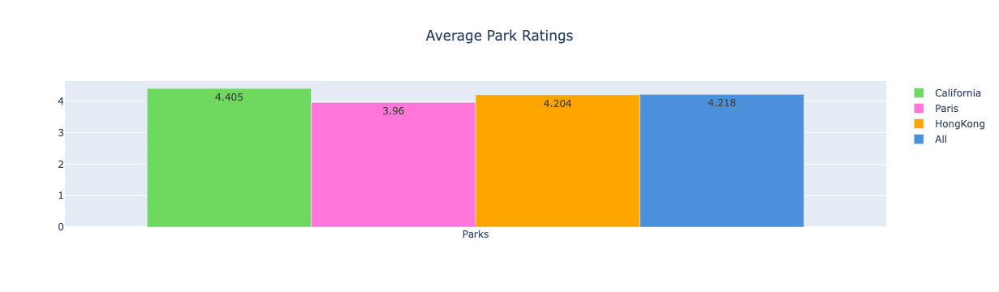

In [47]:
# citation: https://plotly.com/python/bar-charts/
ratings=['Parks']

fig = go.Figure(data=[
    go.Bar(name='California', x=ratings, y=[disney_cali['Rating'].mean() ], text= [np.round(disney_cali['Rating'].mean(), 3)], marker = {'color': '#6ED85F'}),
    go.Bar(name='Paris', x=ratings, y=[disney_paris['Rating'].mean()], text= [np.round(disney_paris['Rating'].mean(), 3)], marker = {'color': '#FF76DA'}),
    go.Bar(name='HongKong', x = ratings, y=[disney_hongkong['Rating'].mean()] , text= [np.round(disney_hongkong['Rating'].mean(), 3)], marker = {'color': 'orange'}),
    go.Bar(name='All', x=ratings, y=[disney['Rating'].mean()], text= [np.round(disney['Rating'].mean(), 3)], marker = {'color': '#4B90DA'})])
           
# Change the bar mode
fig.update_layout(barmode='group', title = 'Average Park Ratings', title_x=.5)
fig.show()

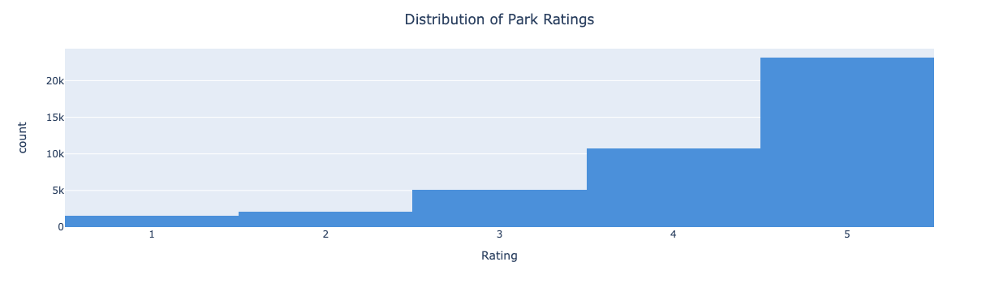

In [48]:
# histogtam of ratings for all disneyland parks
fig = px.histogram(disney, x = 'Rating', color_discrete_sequence = ['#4B90DA'], nbins = 5 , labels={'count': 'Frequency'})
fig.update_layout(title = 'Distribution of Park Ratings', title_x=.5)
fig.show()

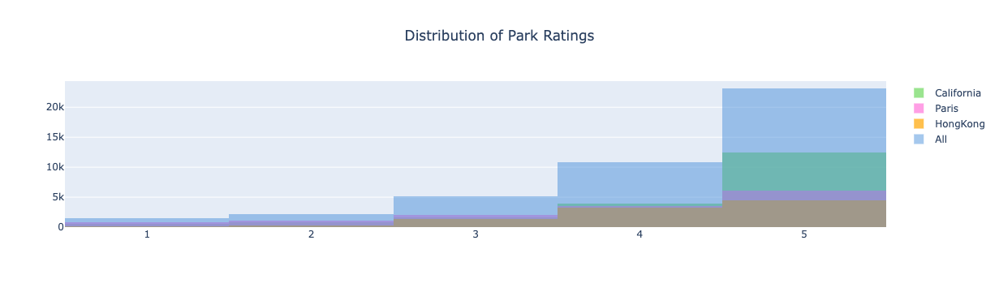

In [49]:
# histogram of ratings for each disneyland park
fig = go.Figure(data=[
    go.Histogram(name='California', x=disney_cali['Rating'],
                 marker = {'color': '#6ED85F'}, opacity = .7,
                 nbinsx=5
                ),
    go.Histogram(name='Paris', x=disney_paris['Rating'],
                 marker = {'color': '#FF76DA'}, opacity = .7,
                 nbinsx=5
                ),
    go.Histogram(name='HongKong', x=disney_hongkong['Rating'],
                 marker = {'color': 'orange'}, opacity = .7,
                 nbinsx=5
                ),
    go.Histogram(name='All', x=disney['Rating'],
                 marker = {'color': '#4B90DA'}, opacity = .5,
                 nbinsx=5
                )])

# Change the bar mode
fig.update_layout( title = 'Distribution of Park Ratings', title_x=.5,  barmode='overlay')
fig.show()

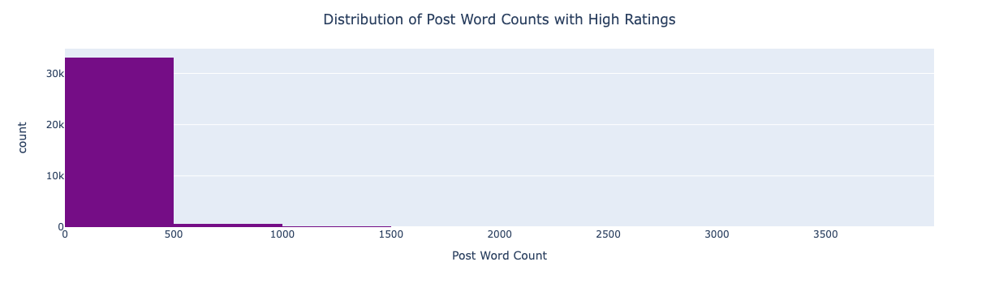

In [50]:
# histogtam of word counts that have high ratings of 4 or more
fig = px.histogram(disney_good_reviews, x = 'text_word_count', color_discrete_sequence = ['#750D86'], nbins = 10, labels={'text_word_count': 'Post Word Count', 'count': 'Frequency'})
fig.update_layout(title = 'Distribution of Post Word Counts with High Ratings', title_x=.5)
fig.show()

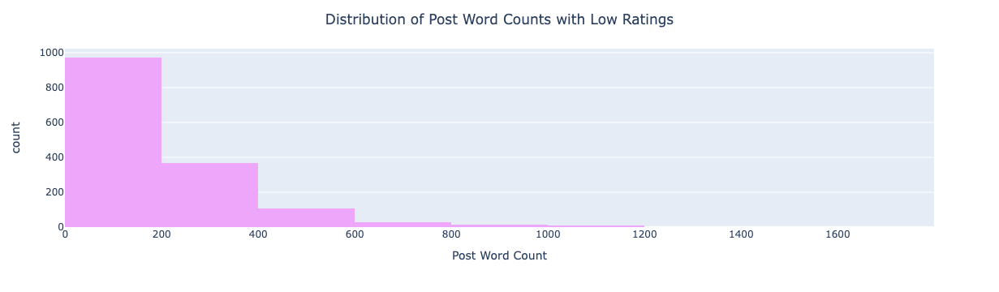

In [51]:
# histogtam of word counts that have low ratings of 1 or less
fig = px.histogram(disney_bad_reviews, x = 'text_word_count', color_discrete_sequence = ['#EEA6FB'], nbins = 10, labels={'text_word_count': 'Post Word Count', 'count': 'Frequency'})
fig.update_layout(title = 'Distribution of Post Word Counts with Low Ratings', title_x=.5)
fig.show()

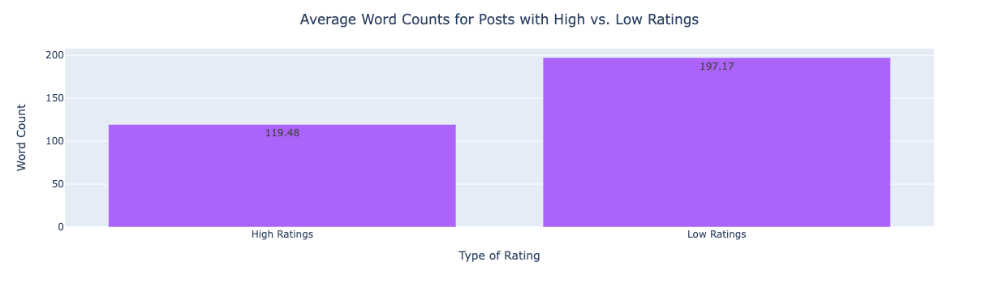

In [52]:
#bar plot of average word counts of posts
fig = px.bar(disney, 
             x=['High Ratings', 'Low Ratings'],
             y= [119.48, 197.17],  
             text = [119.48, 197.17],
             color_discrete_sequence = ['#AB63FA'],
             labels={'x': 'Type of Rating', 'y': 'Word Count'})
fig.update_layout(title = 'Average Word Counts for Posts with High vs. Low Ratings', title_x=.5)
fig.show()

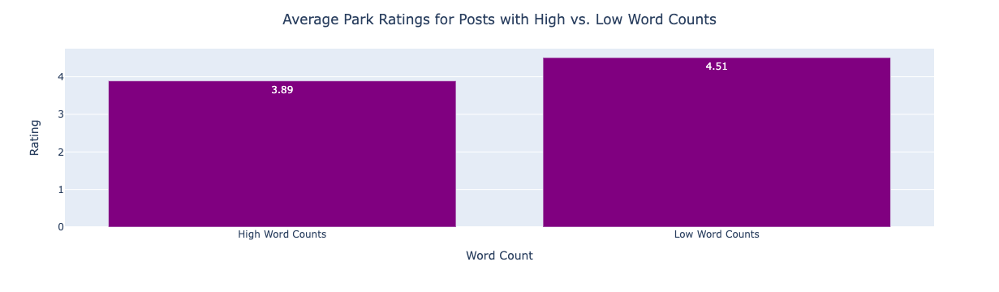

In [55]:
#bar plot of average ratings of posts
fig = px.bar(disney, 
             x=['High Word Counts', 'Low Word Counts'],
             y= [3.89, 4.51],  
             text = [3.89, 4.51] ,
             
             
             color_discrete_sequence = ['purple'],
             labels={'x': 'Word Count', 'y': 'Rating'})
fig.update_layout(title = 'Average Park Ratings for Posts with High vs. Low Word Counts', title_x=.5)
fig.show()

### 6. Analyze Word Counts

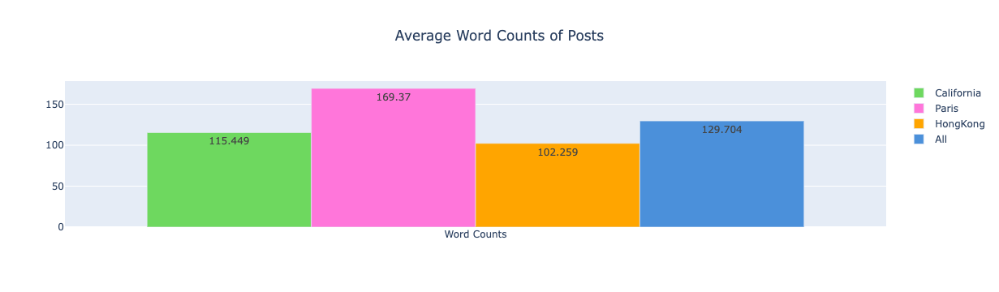

In [56]:
# citation: https://plotly.com/python/bar-charts/
word_counts=['Word Counts']

fig = go.Figure(data=[
    go.Bar(name='California', x=word_counts, y=[disney_cali['text_word_count'].mean()], text = [np.round(disney_cali['text_word_count'].mean(), 3)], marker = {'color': '#6ED85F'}),
    go.Bar(name='Paris', x=word_counts, y=[disney_paris['text_word_count'].mean()], text = [np.round(disney_paris['text_word_count'].mean(), 3)], marker = {'color': '#FF76DA'}),
    go.Bar(name='HongKong', x = word_counts, y=[disney_hongkong['text_word_count'].mean()], text = [np.round(disney_hongkong['text_word_count'].mean(), 3)], marker = {'color': 'orange'}),
    go.Bar(name='All', x=word_counts, y=[disney['text_word_count'].mean()], text= [np.round(disney['text_word_count'].mean(), 3)], marker = {'color': '#4B90DA'})
    
])
# Change the bar mode
fig.update_layout(barmode='group', title = 'Average Word Counts of Posts', title_x=.5)
fig.show()

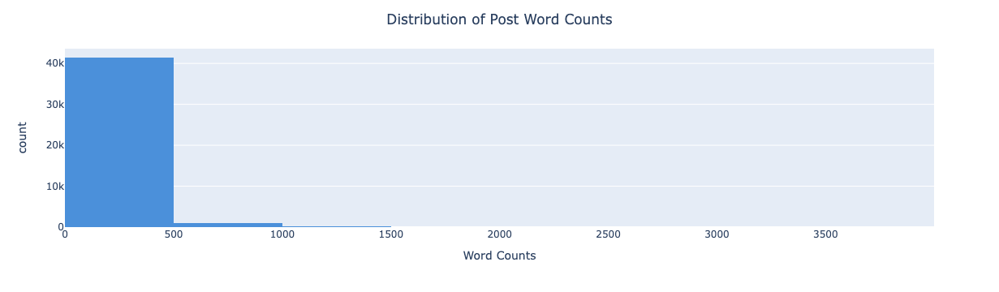

In [57]:
# histogtam of word count for both disneylands data
fig = px.histogram(disney, x = 'text_word_count', color_discrete_sequence = ['#4B90DA'], nbins = 10, labels={'text_word_count': 'Word Counts', 'count': 'Frequency'})
fig.update_layout(title = 'Distribution of Post Word Counts', title_x=.5)
fig.show()

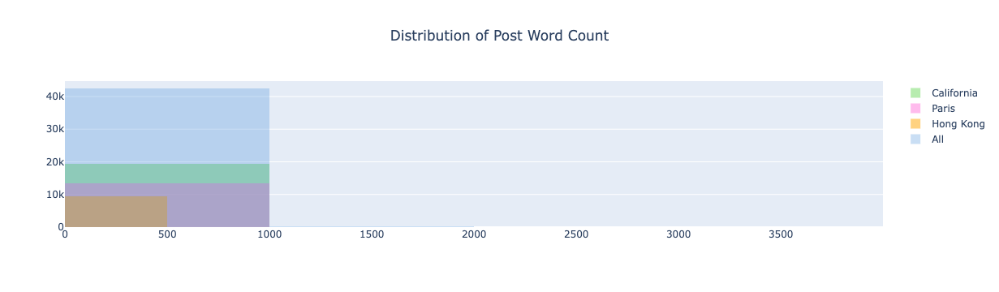

In [58]:
fig = go.Figure(data=[
    go.Histogram(name='California', x=disney_cali['text_word_count'],
                 marker = {'color': '#6ED85F'}, opacity = .5,
                 nbinsx=5
                 
                ),
    go.Histogram(name='Paris', x=disney_paris['text_word_count'],
                 marker = {'color': '#FF76DA'}, opacity = .5,
                 nbinsx=5
                ),
        go.Histogram(name='Hong Kong', x=disney_hongkong['text_word_count'],
                 marker = {'color': 'orange'}, opacity = .5,
                 nbinsx=5
                ),
    go.Histogram(name='All', x=disney['text_word_count'],
                 marker = {'color': '#4B90DA'}, opacity = .3,
                 nbinsx=5
                )])

# Change the bar mode
fig.update_layout( title = 'Distribution of Post Word Count', title_x=.5,  barmode='overlay')
fig.show()

**Popular Words**

In [59]:
# get popular words function
def get_popular_words(df, column_name, num):
    X = df[column_name]
    
    # some common words that I went to exclude from being in the popular word list
    extra_stops = pd.array(["like", 'park', "don", "just", 'disney', 'disneyland', 'rides', 'time','park','ride','food','day','ride'])
    
    # instance of count vectorizer, combines stop words and extra stop words
    cvect_nostop = CountVectorizer(stop_words = text.ENGLISH_STOP_WORDS.union(extra_stops))
    
    #fit it
    X_no_stop = cvect_nostop.fit_transform(X.apply(lambda x: np.str_(x)))
    
    #examine the words
    crypto_text_nostop = pd.DataFrame(X_no_stop.toarray(), columns = cvect_nostop.get_feature_names_out())
    
    return pd.DataFrame(crypto_text_nostop.sum().sort_values().tail(num))

In [60]:
paris_popular_words = get_popular_words(disney_paris, 'clean_text', 10)

In [61]:
cali_popular_words = get_popular_words(disney_cali, 'clean_text', 10)

In [62]:
hongkong_popular_words = get_popular_words(disney_hongkong, 'clean_text', 10)

In [63]:
bad_popular_words = get_popular_words(disney_bad_reviews, 'clean_text', 10)

In [64]:
good_popular_words = get_popular_words(disney_good_reviews, 'clean_text', 10)

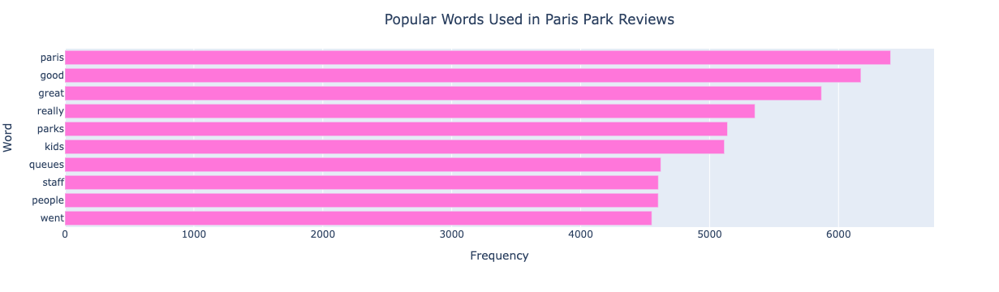

In [65]:
fig = px.bar(paris_popular_words, 
             orientation='h',
             y=paris_popular_words.index,
             x=paris_popular_words[0], 
             color_discrete_sequence = ['#FF76DA'],
             labels={'0': 'Frequency', 'index': 'Word'}
            )

fig.update_layout(title = 'Popular Words Used in Paris Park Reviews', title_x=.53, yaxis = dict(tick0 = 0.5, dtick = 0.75))
fig.show()

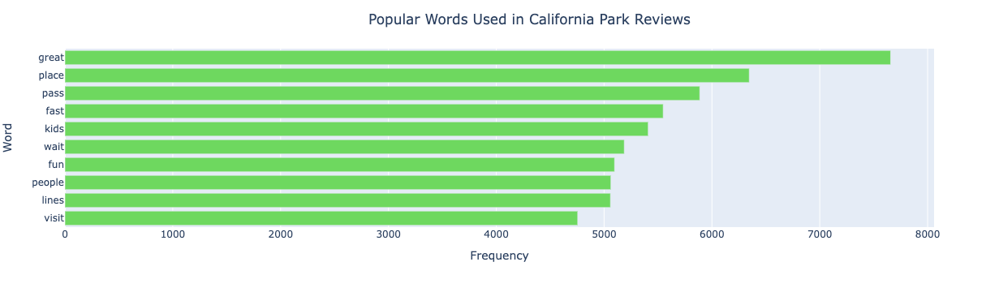

In [66]:
fig = px.bar(cali_popular_words, 
             orientation='h',
             y=cali_popular_words.index,
             x=cali_popular_words[0], 
             color_discrete_sequence = ['#6ED85F'],
             labels={'0': 'Frequency', 'index': 'Word'}
            )

fig.update_layout(title = 'Popular Words Used in California Park Reviews', title_x=.53, yaxis = dict(tick0 = 0.5, dtick = 0.75))
fig.show()

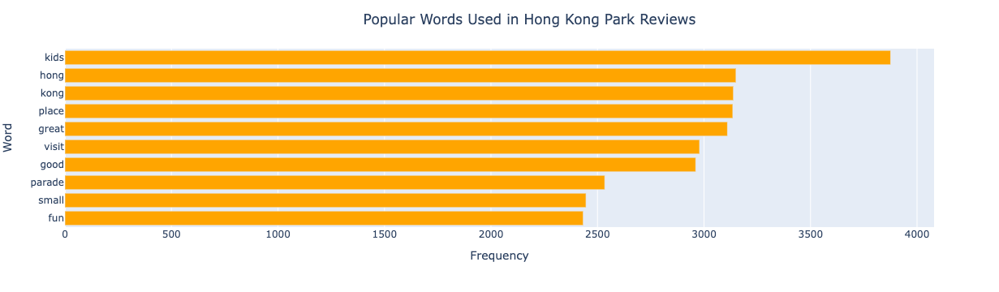

In [67]:
fig = px.bar(hongkong_popular_words, 
             orientation='h',
             y=hongkong_popular_words.index,
             x=hongkong_popular_words[0], 
             color_discrete_sequence = ['orange'],
             labels={'0': 'Frequency', 'index': 'Word'}
            )

fig.update_layout(title = 'Popular Words Used in Hong Kong Park Reviews', title_x=.53, yaxis = dict(tick0 = 0.5, dtick = 0.75))
fig.show()

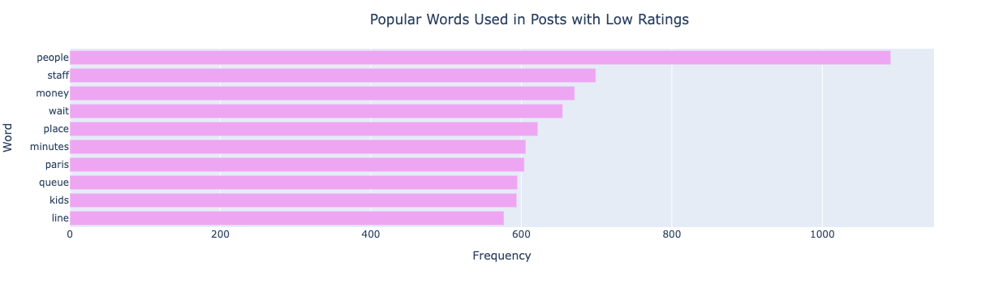

In [68]:
fig = px.bar(bad_popular_words, 
             orientation='h',
             y=bad_popular_words.index,
             x=bad_popular_words[0], 
             color_discrete_sequence = ['#EEA6F3'],
             labels={'0': 'Frequency', 'index': 'Word'}
            )

fig.update_layout(title = 'Popular Words Used in Posts with Low Ratings', title_x=.53, yaxis = dict(tick0 = 0.5, dtick = 0.75))
fig.show()

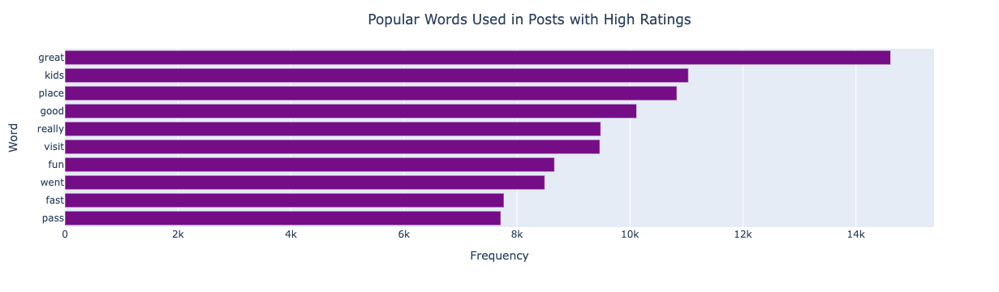

In [69]:
fig = px.bar(good_popular_words, 
             orientation='h',
             y=good_popular_words.index,
             x=good_popular_words[0], 
             color_discrete_sequence = ['#750D86'],
             labels={'0': 'Frequency', 'index': 'Word'}
            )

fig.update_layout(title = 'Popular Words Used in Posts with High Ratings', title_x=.53, yaxis = dict(tick0 = 0.5, dtick = 0.75))
fig.show()

### 7. Analyze Subjectivity Scores

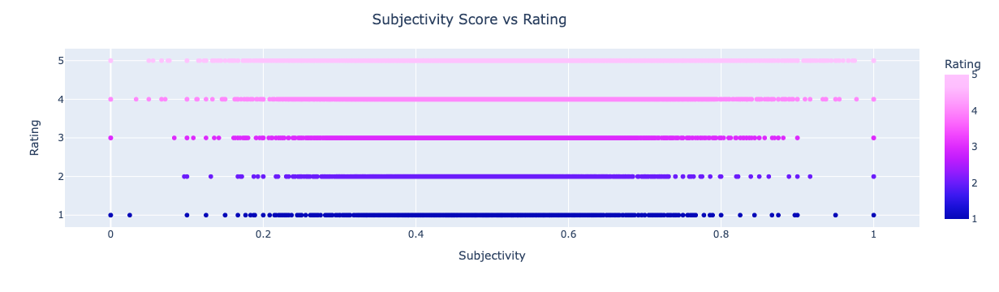

In [161]:
fig = px.scatter(disney, x = "subjectivity", y = "Rating", labels={'subjectivity': 'Subjectivity'}, color="Rating", color_continuous_scale='plotly3' )
fig.update_layout(title = 'Subjectivity Score vs Rating', title_x=.47)
fig.show()

### 8. Analyze Sentiment Scores

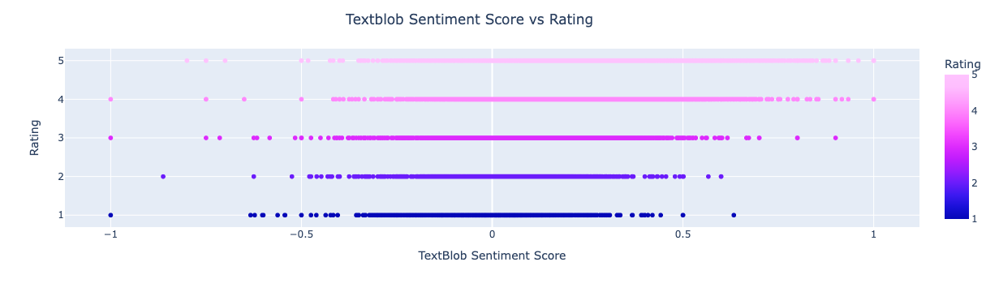

In [162]:
fig = px.scatter(disney, x = "tb_polarity", y = "Rating", labels={'tb_polarity': 'TextBlob Sentiment Score'}, color="Rating", color_continuous_scale='Plotly3' )
fig.update_layout(title = 'Textblob Sentiment Score vs Rating', title_x=.47)
fig.show()

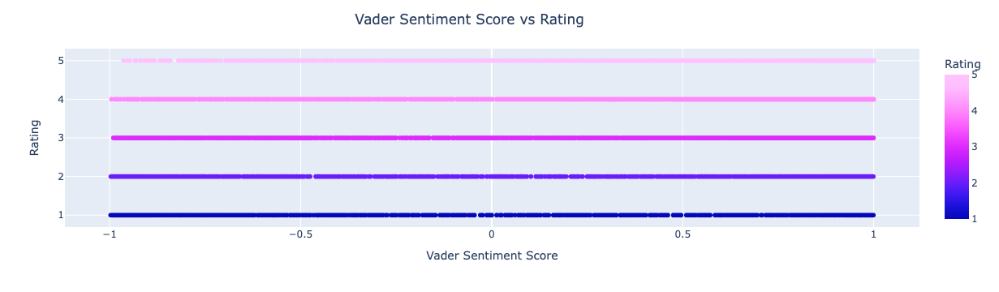

In [163]:
fig = px.scatter(disney, x = "vs_polarity", y = "Rating", labels={'vs_polarity': 'Vader Sentiment Score'}, color="Rating", color_continuous_scale='Plotly3' )
fig.update_layout(title = 'Vader Sentiment Score vs Rating', title_x=.47)
fig.show()

In [167]:
disney_hongkong.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,9620.0,9620.000000,9620.000000,9620.000000,9620.000000,9620.000000
mean,3.0,102.259044,0.522138,0.216325,0.719860,4.204158
std,0.0,103.739529,0.122294,0.169162,0.410354,0.932989
min,3.0,6.000000,0.000000,-1.000000,-0.997100,1.000000
25%,3.0,44.000000,0.448778,0.116211,0.684000,4.000000
50%,3.0,70.000000,0.517657,0.210417,0.897900,4.000000
75%,3.0,123.000000,0.593715,0.312500,0.963600,5.000000
max,3.0,1591.000000,1.000000,1.000000,0.999800,5.000000


In [168]:
disney_paris.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,13630.0,13630.000000,13630.000000,13630.000000,13630.000000,13630.000000
mean,2.0,169.369773,0.525395,0.182306,0.645831,3.960088
std,0.0,189.205720,0.115114,0.168525,0.540232,1.205324
min,2.0,3.000000,0.000000,-0.862500,-0.997200,1.000000
25%,2.0,58.000000,0.456414,0.080060,0.605900,3.000000
50%,2.0,112.000000,0.517700,0.173393,0.906300,4.000000
75%,2.0,209.000000,0.587955,0.275000,0.972475,5.000000
max,2.0,3963.000000,1.000000,1.000000,0.999900,5.000000


In [169]:
disney.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,42656.000000,42656.000000,42656.000000,42656.000000,42656.000000,42656.000000
mean,1.770583,129.703817,0.524574,0.212199,0.686311,4.217695
std,0.792370,154.713032,0.124134,0.175264,0.472970,1.063371
min,1.000000,3.000000,0.000000,-1.000000,-0.997200,1.000000
25%,1.000000,45.000000,0.450786,0.105354,0.654100,4.000000
50%,2.000000,81.000000,0.519638,0.203333,0.897900,5.000000
75%,2.000000,156.000000,0.594202,0.311590,0.966400,5.000000
max,3.000000,3963.000000,1.000000,1.000000,0.999900,5.000000


In [170]:
disney_cali.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,19406.0,19406.000000,19406.000000,19406.000000,19406.000000,19406.000000
mean,1.0,115.449036,0.525204,0.231148,0.698112,4.405339
std,0.0,143.022961,0.130947,0.179984,0.448807,0.975600
min,1.0,7.000000,0.000000,-1.000000,-0.996900,1.000000
25%,1.0,39.000000,0.450000,0.121695,0.665200,4.000000
50%,1.0,71.000000,0.521512,0.224440,0.893400,5.000000
75%,1.0,138.000000,0.599358,0.333333,0.963300,5.000000
max,1.0,3527.000000,1.000000,1.000000,0.999900,5.000000


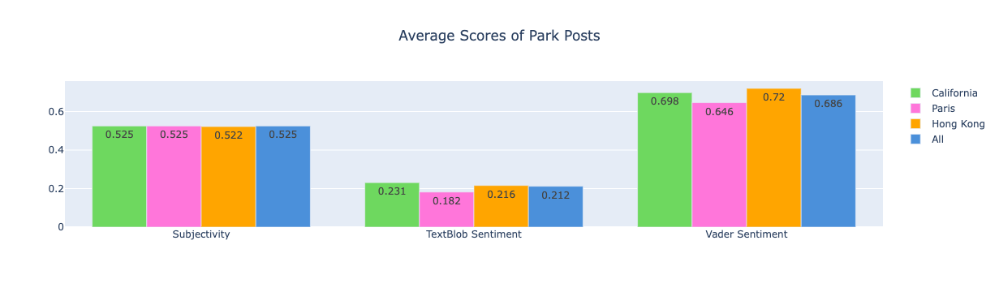

In [202]:
# citation: https://plotly.com/python/bar-charts/
scores=['Subjectivity', 'TextBlob Sentiment', 'Vader Sentiment']

fig = go.Figure(data=[
    go.Bar(name='California', x=scores, y=[.525, .231, .698], text= [.525, .231, .698], marker = {'color': '#6ED85F'}),
    go.Bar(name='Paris', x=scores, y=[.525, .182, .646], text =[.525, .182, .646] , marker = {'color': '#FF76DA'}),
    go.Bar(name='Hong Kong', x=scores, y=[.522, .216, .72], text = [.522, .216, .72], marker = {'color': 'orange'}),
    go.Bar(name='All', x=scores, y=[.525, .212, .686], text = [.525, .212, .686], marker = {'color': '#4B90DA'})
])
# Change the bar mode
fig.update_layout(barmode='group', title = 'Average Scores of Park Posts', title_x=.5)
fig.show()

In [176]:
disney_good_reviews.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,33921.000000,33921.000000,33921.000000,33921.000000,33921.000000,33921.000000
mean,1.741989,119.417558,0.532326,0.248397,0.791142,4.682350
std,0.805126,148.723498,0.126718,0.163047,0.325499,0.465569
min,1.000000,3.000000,0.000000,-1.000000,-0.995100,4.000000
25%,1.000000,42.000000,0.458081,0.146944,0.775900,4.000000
50%,2.000000,74.000000,0.527083,0.235417,0.919300,5.000000
75%,2.000000,141.000000,0.601775,0.336574,0.971200,5.000000
max,3.000000,3963.000000,1.000000,1.000000,0.999900,5.000000


In [177]:
disney_bad_reviews.describe()

,park,text_word_count,subjectivity,tb_polarity,vs_polarity,Rating
count,1499.000000,1499.000000,1499.000000,1499.000000,1499.000000,1499.0
mean,1.781855,197.166111,0.489945,-0.002762,-0.084952,1.0
std,0.632702,184.002586,0.113088,0.139996,0.715426,0.0
min,1.000000,14.000000,0.000000,-1.000000,-0.997200,1.0
25%,1.000000,81.000000,0.424063,-0.075000,-0.803850,1.0
50%,2.000000,147.000000,0.490606,0.007855,-0.202300,1.0
75%,2.000000,249.000000,0.557500,0.075291,0.659700,1.0
max,3.000000,1649.000000,1.000000,0.633333,0.999000,1.0


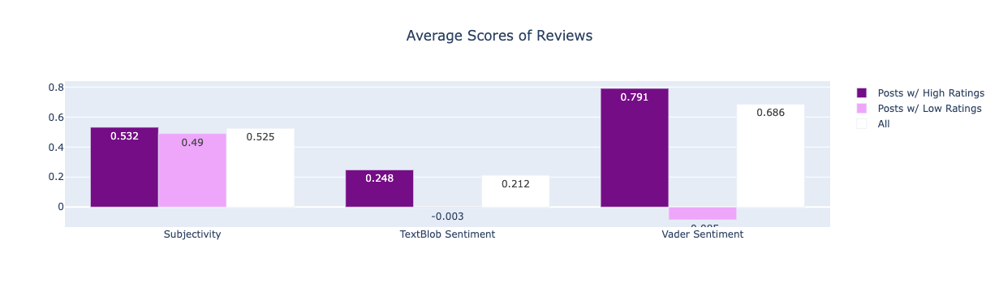

In [192]:
# citation: https://plotly.com/python/bar-charts/
scores=['Subjectivity', 'TextBlob Sentiment', 'Vader Sentiment']

fig = go.Figure(data=[
    go.Bar(name='Posts w/ High Ratings', x=scores, y=[.532, .248, .791], text = [.532, .248, .791], marker = {'color': '#750d86'}),
    go.Bar(name='Posts w/ Low Ratings', x=scores, y=[.490, -0.003, -0.085], text = [.490, -0.003, -0.085], marker = {'color': '#eea6fb'}),
    go.Bar(name='All', x=scores, y=[.525, .212, .686], text = [.525, .212, .686], marker = {'color': 'white'})
])
# Change the bar mode
fig.update_layout(barmode='group', title = 'Average Scores of Reviews', title_x=.5)
fig.show()